In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import os


module_path = os.path.abspath(os.path.join(os.getcwd(), '..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import plot_config as pc
import ml_functions as ml

pc.apply_custom_mpl_settings()

2025-12-17 11:31:26.131370: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


<h1><span style="color:orange">Numerical Simulation Laboratory (NSL)</span></h1>

<h2><span style="color:blue"> Keras - Neural Network regression</span></h2>

<h2><span style="color:green">Numerical Exercise 11.2: Polynomial Fit $f(x) = 3x^3 - 2x^2 - 3x + 4$</span></h2>

The objective of this exercise is to extend the model's capabilities to perform a regression fit for a real-variable polynomial function:

$$f(x) = 3x^3 - 2x^2 - 3x + 4.$$

Given that the target function is non-linear, we anticipate that the simple linear architecture developed in Exercise 11.1 will be insufficient. We will confirm this assumption and then systematically optimize a new, more complex Neural Network (NN) architecture.

The true function and its parameters are defined as:

In [2]:
a, b, c, d = 3.0, -2.0, -3.0, 4.0

def f_true(x):
    return a*x**3 + b*x**2 + c*x + d

### 1. Baseline Test with Linear Model (Zero Hidden Layers)

We first test the linear model, optimized in the previous exercise, on the new polynomial dataset.

Fixed Parameters: $N=5000$, $\sigma=0.5$, $\text{epochs}=100$, $\text{optimizer}=\text{SGD}$, $\text{activation}=\text{linear}$, $\text{hidden\_neurons}=[~]$.

In [3]:
x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 5000, 0.5, 100
input_dim, output_dim = 1, 1

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

In [4]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
hidden_neurons = []
act_func, optimizer, loss, metrics = 'linear', 'sgd', 'mse', 'mae'

title = f"Fit polinomiale"
titles_list.append(title)

model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

model_list.append(model)
history_list.append(history)
y_pred_list.append(y_pred)

/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


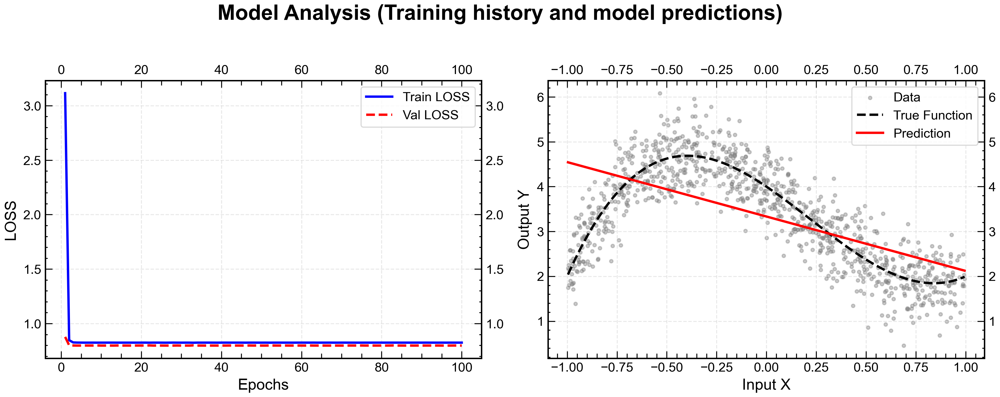

In [5]:
ml.plot_history_and_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, history_list, [''], [''], 'Model Analysis (Training history and model predictions)', metric_name='loss')

As expected, the simple linear network structure is unable to capture the non-linear curvature of the cubic polynomial. The model produces only a straight line, confirming the low capacity of the previous architecture.

### 2. Optimization of Hidden Layers and Activation Function

We now introduce hidden layers and non-linear activation functions, which are necessary for universal function approximation (required for the cubic polynomial). We fix the initial complex architecture at **4 hidden layers** with $[5, 10, 10, 5]$ neurons, and re-use the optimized parameters from the linear fit ($N=5000$, $\sigma=0.5$, $\text{epochs}=100$, $\text{optimizer}=\text{SGD}$).

#### A. Influence of Activation Function

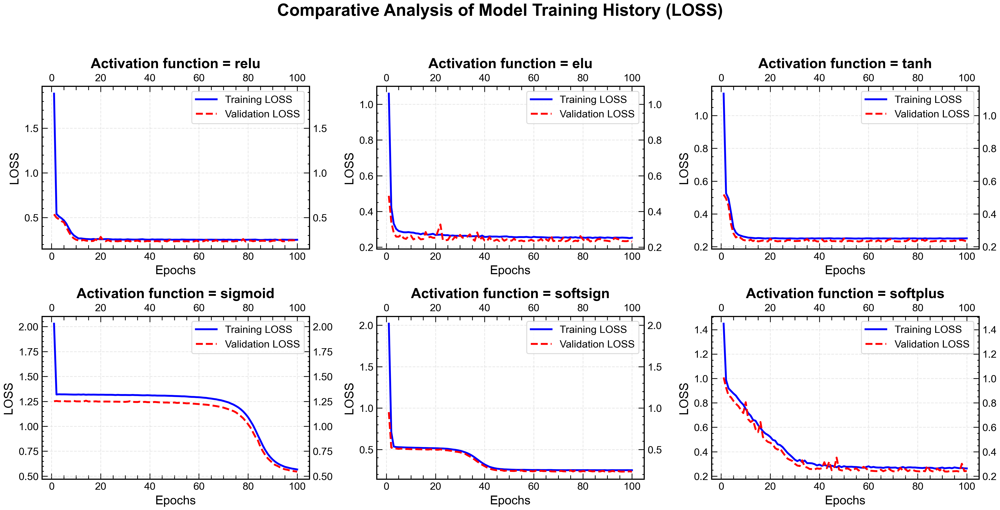

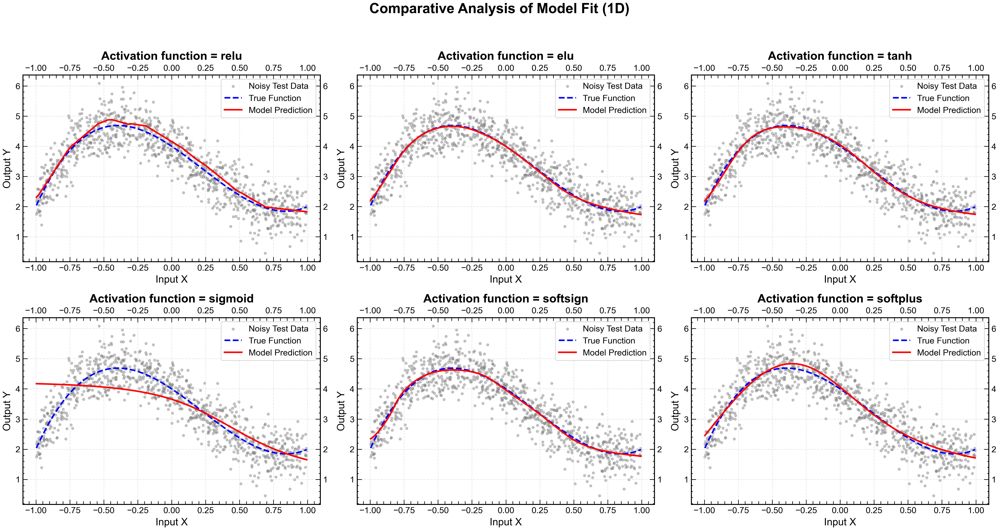

In [6]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_act_funcs, mse_true_act_funcs = [], []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 5000, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = [5,10,10,5]
optimizer, loss, metrics = 'sgd', 'mse', 'mae'
act_funcs = ['relu', 'elu', 'tanh', 'sigmoid', 'softsign', 'softplus']

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for actf in(act_funcs):

    title = f"Activation function = {actf}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=actf, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_act_funcs.append(results['loss'])
    mse_true_act_funcs.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, titles_list)

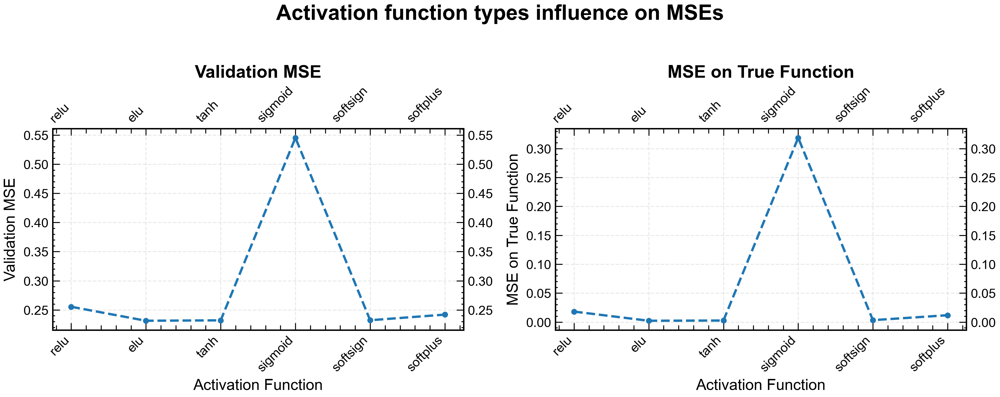

In [7]:
ml.plot_compare(act_funcs, mse_test_act_funcs, mse_true_act_funcs, 'Activation function types influence on MSEs', 'activation function')

All non-linear activation functions (except for `sigmoid` which struggles with this range) produce similar results in terms of validation loss.

- **ReLU** introduces visible discontinuities or "kinks" where the function changes concavity, making the predicted curve less smooth.

- **Tanh**, **ELU**, and **Softsign** provide smoother fits.

- **Softsign** is selected as the best performer, showing minimal MSE on both the noisy labels and the true labels, and providing a visually smooth approximation.

#### B. Influence of Network Depth and Width (Simpler Structures)

We fix the activation function to **Softsign** and study the optimal depth, keeping the width fixed at **5 neurons per layer**.

/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


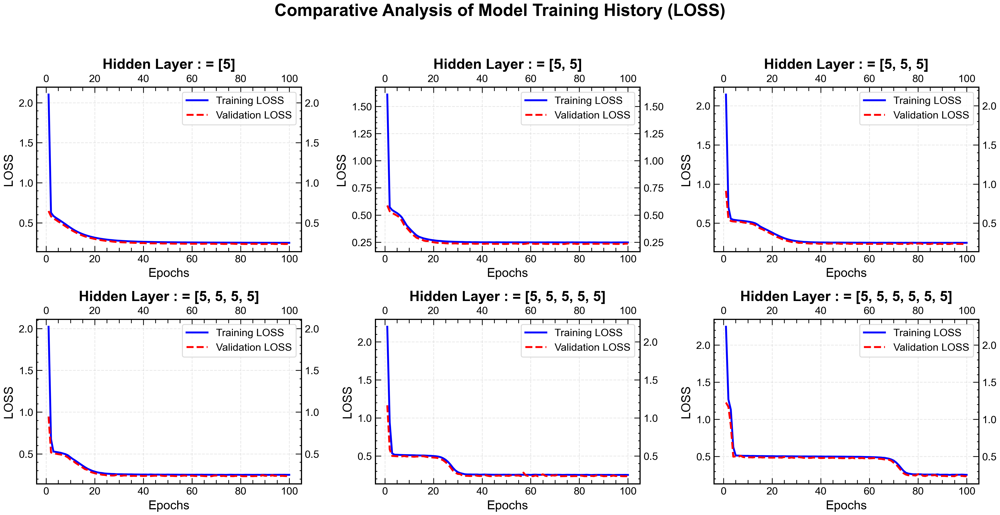

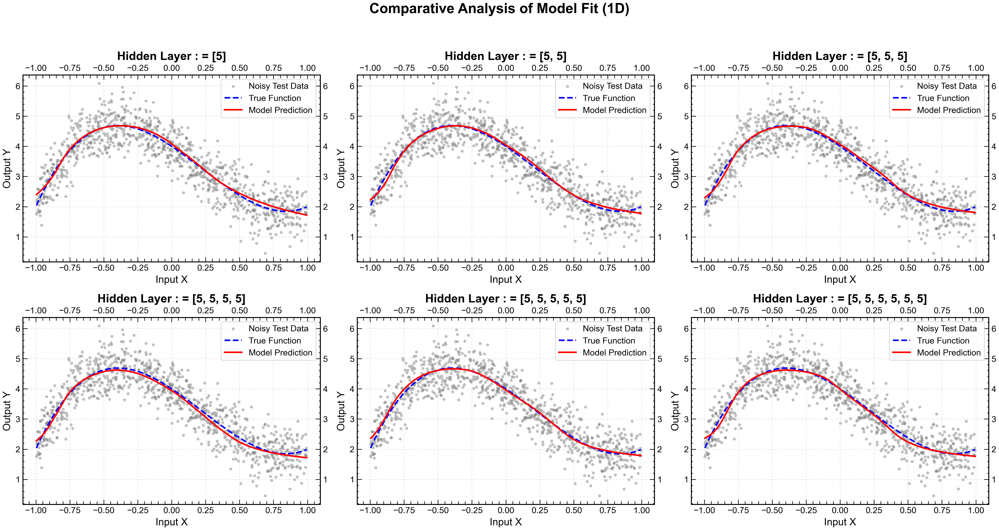

In [8]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_hidden_neurons, mse_true_hidden_neurons = [], []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 5000, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = [[5], [5,5], [5,5,5], [5,5,5,5], [5,5,5,5,5], [5,5,5,5,5,5]]
optimizer, act_func, loss, metrics = 'sgd', 'softsign', 'mse', 'mae'

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for n in(hidden_neurons):

    title = f"Hidden Layer : = {n}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=n, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_hidden_neurons.append(results['loss'])
    mse_true_hidden_neurons.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, titles_list)

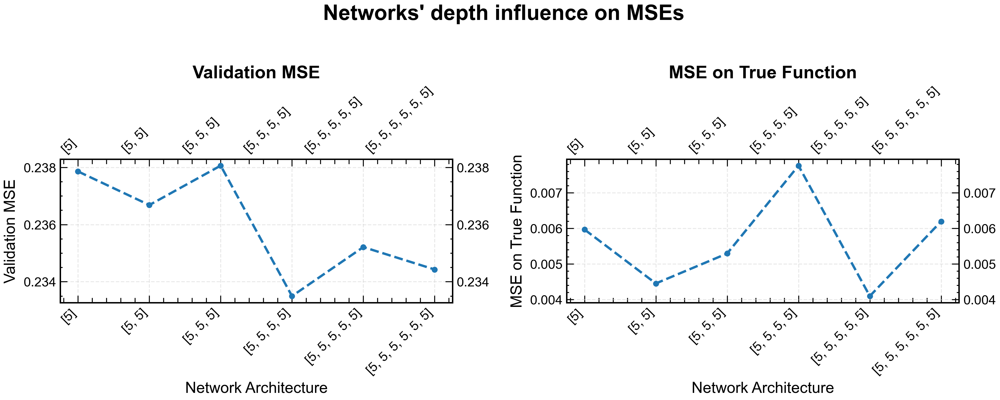

In [9]:
ml.plot_compare(hidden_neurons, mse_test_hidden_neurons, mse_true_hidden_neurons, 'Networks\' depth influence on MSEs', 'layers')

#### Observation:

- The single-layer network (`[5]`) performs the worst, showing the highest Validation MSE and Diagnostic MSE, indicating insufficient capacity (high **bias**).

- Networks with $2$ to $5$ layers show similar high performance, successfully capturing the polynomial curve. The $3$-layer architecture shows a slightly better Validation MSE, though the differences are marginal.

- This suggests that a relatively shallow depth (2-5 layers) is sufficient to model the cubic polynomial.

#### C. Influence of Network Width (Complex Structures)

We further explore different wide, complex architectures, focusing on 5-layer structures with varying widths (e.g., hourglass, diamond shapes).

/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


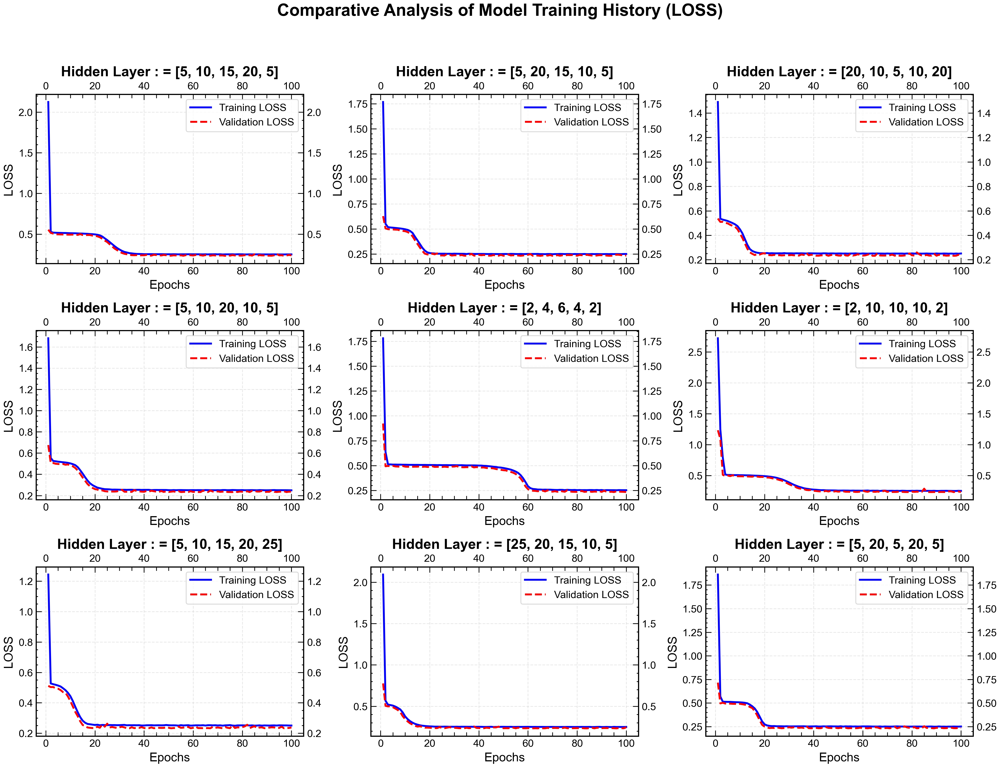

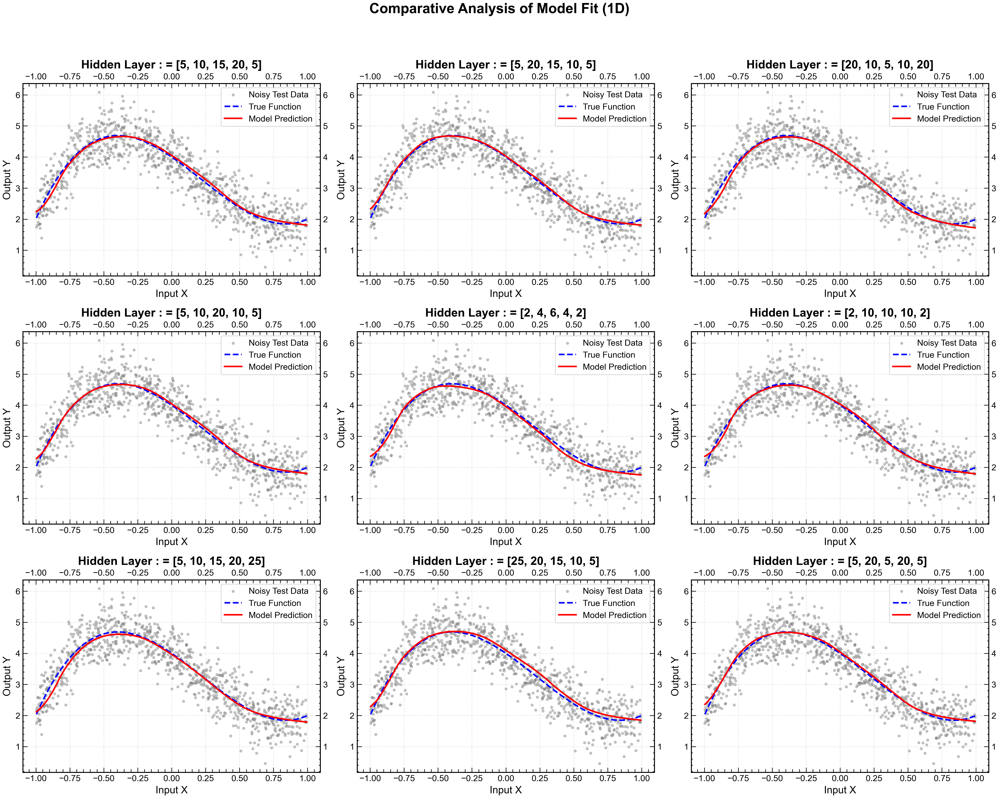

In [10]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_hidden_neurons, mse_true_hidden_neurons = [], []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 5000, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = [[5,10,15,20,5], [5,20,15,10,5], [20,10,5,10,20], [5,10,20,10,5], [2,4,6,4,2], [2,10,10,10,2], [5,10,15,20,25], [25,20,15,10,5], [5,20,5,20,5]]
optimizer, act_func, loss, metrics = 'sgd', 'softsign', 'mse', 'mae'

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for n in(hidden_neurons):

    title = f"Hidden Layer : = {n}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=n, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_hidden_neurons.append(results['loss'])
    mse_true_hidden_neurons.append(results['mse_on_true'])


ml.plot_comparison_history(history_list, titles_list, metric_name='loss')
ml.plot_comparison_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, titles_list)

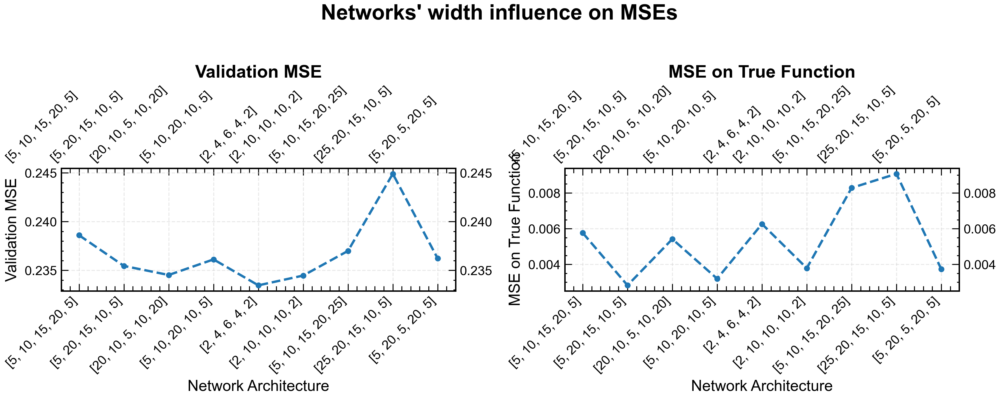

In [11]:
ml.plot_compare(hidden_neurons, mse_test_hidden_neurons, mse_true_hidden_neurons, 'Networks\' width influence on MSEs', 'layers')

#### Observation:

- The architecture `[2, 4, 6, 4, 2]` performs significantly worse than all others. This is due to its low total neuron count, which results in insufficient capacity to model the complexity of the cubic function, leading to high bias.

- Most other complex, wider architectures produce highly similar optimal results.

- The "hourglass" structure, such as `[20, 10, 5, 10, 20]`, is selected as the preferred model due to its optimal balance and tendency to perform slightly better in the comparison plots.

### 3. Final Optimization of Optimizer

We now analyze the convergence of the complex optimal architecture (`[20, 10, 5, 10, 20]`, $\text{activation}=\text{softsign}$) across different optimizers, using the fixed parameters ($N=5000, \sigma=0.5, \text{epochs}=100$).

In [12]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []
mse_test_optimizer, mse_true_optimizer = [], []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 5000, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = [20,10,5,10,20]
act_func, loss, metrics = 'softsign', 'mse', 'mae'
optimizers = ['sgd', 'adagrad', 'adadelta', 'adam', 'adamax', 'nadam']

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

for o in(optimizers):

    title = f"Optimizer = {o}"
    titles_list.append(title)

    model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=act_func, optimizer=o, loss=loss, metrics=[metrics])
    history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
    results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

    model_list.append(model)
    history_list.append(history)
    y_pred_list.append(y_pred)
    mse_test_optimizer.append(results['loss'])
    mse_true_optimizer.append(results['mse_on_true'])


/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


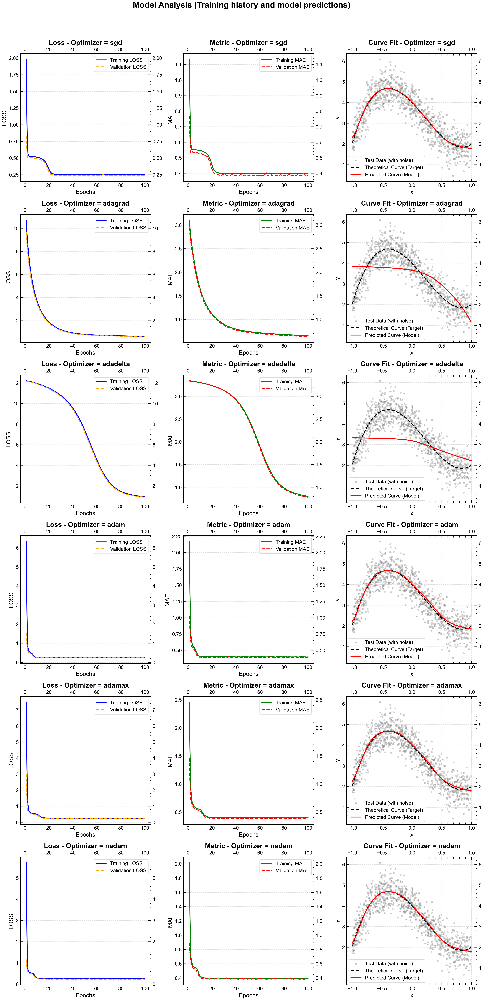

In [13]:
ml.plot_optimizer_analysis(model_list, x_test, y_test, y_true_test, y_pred_list, history_list, titles_list, loss_name='loss', metric_name=metrics)

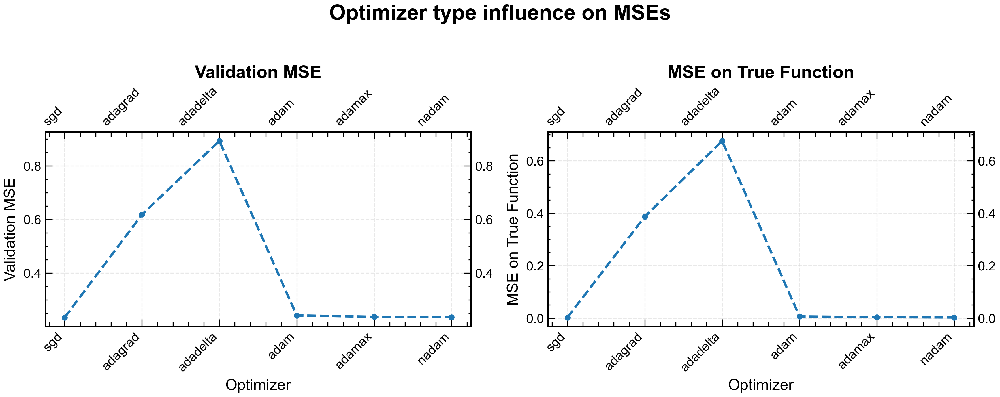

In [14]:
ml.plot_compare(optimizers, mse_test_optimizer, mse_true_optimizer, 'Optimizer type influence on MSEs', 'optimizer')

#### Discussion on Optimizer Performance

All optimizers except **Adagrad** and **Adadelta** show similar final MSE performance. In this complex, non-linear case:

- SGD is slower to converge.

- Adam, Adamax, and Nadam (Adaptive Gradient methods) achieve rapid convergence.

- Adam is the fastest-converging optimizer.

### Final Model Choice:
- **Optimizer**: Adam
- **Loss Function**: MSE
- **Architecture**: Input (1) -> [20, 10, 5, 10, 20] -> Output (1)
- **Activation Function**: Softsign


### 4. Final Model Training and Fit

We train the final, optimized model using the following hyperparameters: $\text{Optimizer}=\text{Adam}$, $\text{Activation}=\text{Softsign}$, $\text{Architecture}=[20, 10, 5, 10, 20]$.

/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


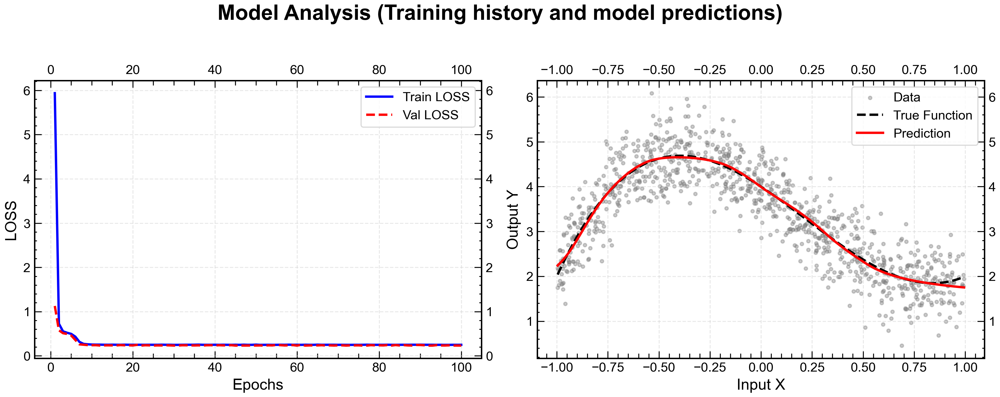

In [15]:
model_list = []
history_list = []
y_pred_list = []
titles_list = []

x_min, x_max, n_data, sigma, n_epoch = -1.0, 1.0, 5000, 0.5, 100
input_dim, output_dim = 1, 1
hidden_neurons = [20,10,5,10,20]
optimizer, act_func, loss, metrics = 'adam', 'softsign', 'mse', 'mae'

x_train, y_train, x_test, y_test, y_true_test = ml.generate_dataset_regression(input_dim, x_min, x_max, output_dim, n_data, f_true, sigma)

model = ml.generate_network_regression(input_dim, output_dim, hidden_neurons=hidden_neurons, act_func=act_func, optimizer=optimizer, loss=loss, metrics=[metrics])
history = ml.model_optimization_regression(model, x_train, y_train, batch_size=32, epochs=n_epoch, x_test=x_test, y_test=y_test)
results, y_pred = ml.evaluate_model(model, x_test, y_test, y_true_test)

model_list.append(model)
history_list.append(history)
y_pred_list.append(y_pred)

ml.plot_history_and_fit_1d(model_list, x_test, y_test, y_true_test, y_pred_list, history_list, [''], [''], 'Model Analysis (Training history and model predictions)', metric_name='loss')

### 5. Extrapolation Test (Out-of-Sample Prediction)

We now want to test the final, optimized model by making predictions outside the training range, $x \in [-1, 1]$, on a wider interval $x \in [-2, 2]$.

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


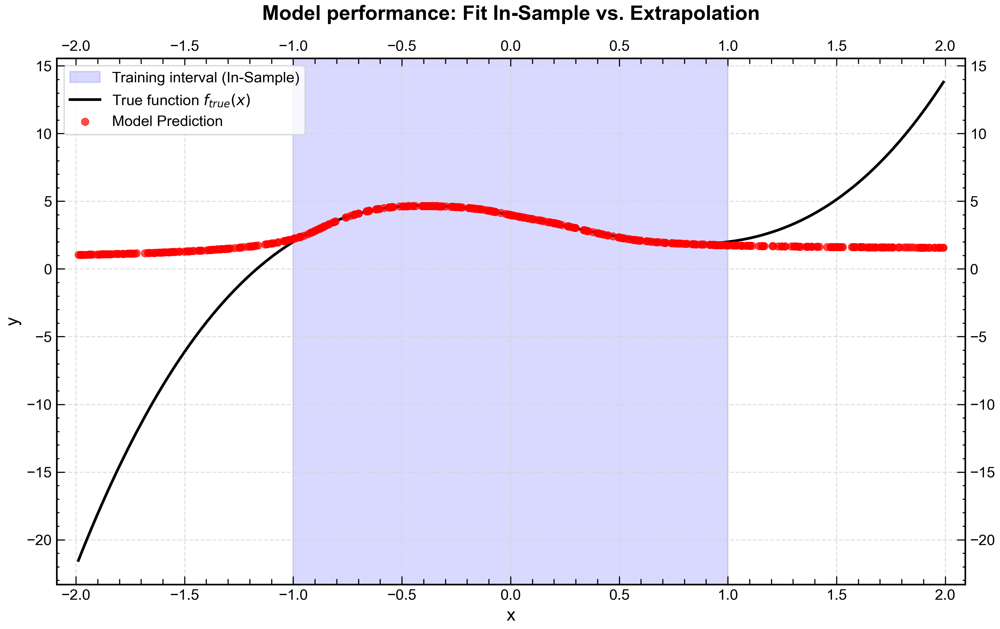

In [16]:
x = np.random.uniform(-2, 2, 500)
x = np.sort(x)
x = x[:, np.newaxis]

y_predicted = model.predict(x)
y_true = f_true(x)

fig, ax = plt.subplots(figsize=(12, 7))

ax.axvspan(x_min, x_max, color='blue', alpha=0.15, label='Training interval (In-Sample)')

ax.plot(x, y_true, label='True function $f_{true}(x)$', color='black', zorder=2)

ax.scatter(x, y_predicted, label='Model Prediction', marker='o', s=30, alpha=0.7, color='red', linewidths=0.5, zorder=3)

ax.set_title('Model performance: Fit In-Sample vs. Extrapolation', pad=15)
ax.set_xlabel('x')
ax.set_ylabel('y')

ax.legend(frameon=True)
ax.set_xlim(x.min() - 0.1, x.max() + 0.1) 

plt.show()

#### Conclusion on Extrapolation:

The model exhibits **excellent interpolation performance**, accurately reproducing the polynomial within the training interval $x \in [-1, 1]$. However, the model **fails completely** to generalize outside this domain. The predictions beyond $|x| > 1$ stabilize to a near-constant value, completely missing the characteristic growth of the cubic polynomial. This **lack of extrapolation capability** is a common limitation of standard Neural Networks trained using Empirical Risk Minimization (ERM) and highlights a critical principle: **Neural Networks learn to interpolate the features present in the training set and should not be relied upon to make predictions outside the data domain they have observed**.